In [1]:
import folium
import numpy as np
import pandas as pd
import seaborn as sns
import plotly.express as px
import matplotlib.pyplot as plt
from collections import defaultdict
from scipy.stats import pearsonr, spearmanr, f_oneway
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, r2_score

# Data Exploration & Pre-Processing

In [2]:
data = pd.read_csv("Dataset .csv")

In [3]:
data

,Restaurant ID,Restaurant Name,Country Code,City,Address,Locality,Locality Verbose,Longitude,Latitude,Cuisines,...,Currency,Has Table booking,Has Online delivery,Is delivering now,Switch to order menu,Price range,Aggregate rating,Rating color,Rating text,Votes
0,6317637,Le Petit Souffle,162,Makati City,"Third Floor, Century City Mall, Kalayaan Avenu...","Century City Mall, Poblacion, Makati City","Century City Mall, Poblacion, Makati City, Mak...",121.027535,14.565443,"French, Japanese, Desserts",...,Botswana Pula(P),Yes,No,No,No,3,4.8,Dark Green,Excellent,314
1,6304287,Izakaya Kikufuji,162,Makati City,"Little Tokyo, 2277 Chino Roces Avenue, Legaspi...","Little Tokyo, Legaspi Village, Makati City","Little Tokyo, Legaspi Village, Makati City, Ma...",121.014101,14.553708,Japanese,...,Botswana Pula(P),Yes,No,No,No,3,4.5,Dark Green,Excellent,591
2,6300002,Heat - Edsa Shangri-La,162,Mandaluyong City,"Edsa Shangri-La, 1 Garden Way, Ortigas, Mandal...","Edsa Shangri-La, Ortigas, Mandaluyong City","Edsa Shangri-La, Ortigas, Mandaluyong City, Ma...",121.056831,14.581404,"Seafood, Asian, Filipino, Indian",...,Botswana Pula(P),Yes,No,No,No,4,4.4,Green,Very Good,270
3,6318506,Ooma,162,Mandaluyong City,"Third Floor, Mega Fashion Hall, SM Megamall, O...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.056475,14.585318,"Japanese, Sushi",...,Botswana Pula(P),No,No,No,No,4,4.9,Dark Green,Excellent,365
4,6314302,Sambo Kojin,162,Mandaluyong City,"Third Floor, Mega Atrium, SM Megamall, Ortigas...","SM Megamall, Ortigas, Mandaluyong City","SM Megamall, Ortigas, Mandaluyong City, Mandal...",121.057508,14.584450,"Japanese, Korean",...,Botswana Pula(P),Yes,No,No,No,4,4.8,Dark Green,Excellent,229
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9546,5915730,Naml۱ Gurme,208,��stanbul,"Kemanke�� Karamustafa Pa��a Mahallesi, R۱ht۱m ...",Karak�_y,"Karak�_y, ��stanbul",28.977392,41.022793,Turkish,...,Turkish Lira(TL),No,No,No,No,3,4.1,Green,Very Good,788
9547,5908749,Ceviz A��ac۱,208,��stanbul,"Ko��uyolu Mahallesi, Muhittin ��st�_nda�� Cadd...",Ko��uyolu,"Ko��uyolu, ��stanbul",29.041297,41.009847,"World Cuisine, Patisserie, Cafe",...,Turkish Lira(TL),No,No,No,No,3,4.2,Green,Very Good,1034
9548,5915807,Huqqa,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.034640,41.055817,"Italian, World Cuisine",...,Turkish Lira(TL),No,No,No,No,4,3.7,Yellow,Good,661
9549,5916112,A���k Kahve,208,��stanbul,"Kuru�_e��me Mahallesi, Muallim Naci Caddesi, N...",Kuru�_e��me,"Kuru�_e��me, ��stanbul",29.036019,41.057979,Restaurant Cafe,...,Turkish Lira(TL),No,No,No,No,4,4.0,Green,Very Good,901


In [4]:
data.shape

(9551, 21)

In [5]:
data.isna().sum()

Restaurant ID           0
Restaurant Name         0
Country Code            0
City                    0
Address                 0
Locality                0
Locality Verbose        0
Longitude               0
Latitude                0
Cuisines                9
Average Cost for two    0
Currency                0
Has Table booking       0
Has Online delivery     0
Is delivering now       0
Switch to order menu    0
Price range             0
Aggregate rating        0
Rating color            0
Rating text             0
Votes                   0
dtype: int64

In [6]:
rows_with_missing = data[data.isna().any(axis=1)]
print(rows_with_missing)

     Restaurant ID                 Restaurant Name  Country Code  \
84        17284105                   Cookie Shoppe           216   
87        17284211  Pearly's Famous Country Cookng           216   
94        17284158               Jimmie's Hot Dogs           216   
297       17374552                  Corkscrew Cafe           216   
328       17501439                        Dovetail           216   
346       17606621            HI Lite Bar & Lounge           216   
368       17059060                       Hillstone           216   
418       17142698                Leonard's Bakery           216   
455       17616465        Tybee Island Social Club           216   

               City                                          Address  \
84           Albany               115 N Jackson St, Albany, GA 31701   
87           Albany             814 N Slappey Blvd, Albany, GA 31701   
94           Albany               204 S Jackson St, Albany, GA 31701   
297     Gainesville            

In [7]:
# Handling missing values - Filling missing values in 'Cuisines' with 'Unknown'
data['Cuisines'].fillna('Unknown', inplace=True)

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/2574061443.py:2: FutureWarning: A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.


  data['Cuisines'].fillna('Unknown', inplace=True)


In [8]:
# Convert 'Restaurant ID' to string
data['Restaurant ID'] = data['Restaurant ID'].astype(str)
# Verify the data type conversion
print(data.dtypes['Restaurant ID'])

object


In [9]:
data['Rating text'].value_counts()

Rating text
Average      3737
Not rated    2148
Good         2100
Very Good    1079
Excellent     301
Poor          186
Name: count, dtype: int64

In [10]:
unique_rating_texts = data['Rating text'].unique()

# Initialize a dictionary to store results
rating_patterns = {}

# Analyze each unique value in 'Rating text'
for rating_text in unique_rating_texts:
    # Filter data for the current 'Rating text'
    filtered_data = data[data['Rating text'] == rating_text]
    
    # Calculate statistics for 'Aggregate rating'
    stats = {
        'count': filtered_data['Aggregate rating'].count(),
        'mean': filtered_data['Aggregate rating'].mean(),
        'min': filtered_data['Aggregate rating'].min(),
        'max': filtered_data['Aggregate rating'].max()
    }
    rating_patterns[rating_text] = stats

In [11]:
rating_patterns

{'Excellent': {'count': 301,
  'mean': 4.659800664451827,
  'min': 4.5,
  'max': 4.9},
 'Very Good': {'count': 1079,
  'mean': 4.168118628359592,
  'min': 4.0,
  'max': 4.4},
 'Good': {'count': 2100, 'mean': 3.6834285714285713, 'min': 3.5, 'max': 3.9},
 'Average': {'count': 3737, 'mean': 3.051618945678352, 'min': 2.5, 'max': 3.4},
 'Not rated': {'count': 2148, 'mean': 0.0, 'min': 0.0, 'max': 0.0},
 'Poor': {'count': 186, 'mean': 2.2978494623655914, 'min': 1.8, 'max': 2.4}}

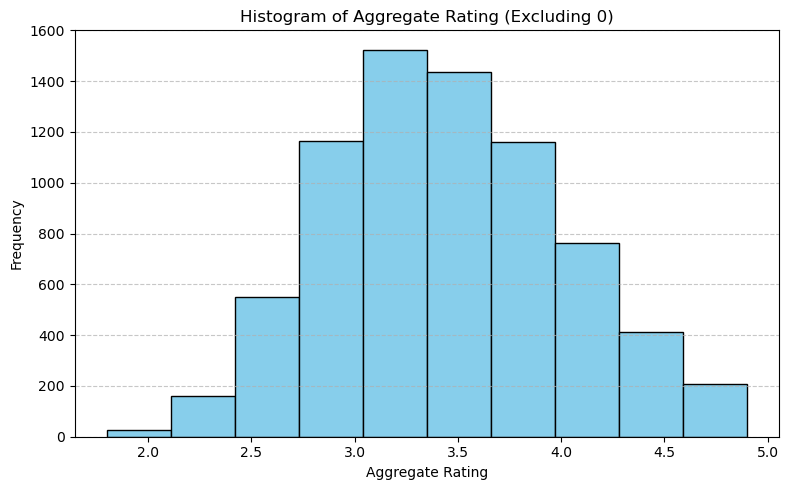

In [12]:
filtered_data = data[data['Aggregate rating'] != 0]
# Generate a histogram for 'Aggregate rating'
plt.figure(figsize=(8, 5))
filtered_data['Aggregate rating'].plot(kind='hist', bins=10, color='skyblue', edgecolor='black')
plt.title('Histogram of Aggregate Rating (Excluding 0)')
plt.xlabel('Aggregate Rating')
plt.ylabel('Frequency')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.tight_layout()
plt.show()

# Descriptive Analysis

In [13]:
data.describe()

,Country Code,Longitude,Latitude,Average Cost for two,Price range,Aggregate rating,Votes
count,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000,9551.000000
mean,18.365616,64.126574,25.854381,1199.210763,1.804837,2.666370,156.909748
std,56.750546,41.467058,11.007935,16121.183073,0.905609,1.516378,430.169145
min,1.000000,-157.948486,-41.330428,0.000000,1.000000,0.000000,0.000000
25%,1.000000,77.081343,28.478713,250.000000,1.000000,2.500000,5.000000
50%,1.000000,77.191964,28.570469,400.000000,2.000000,3.200000,31.000000
75%,1.000000,77.282006,28.642758,700.000000,2.000000,3.700000,131.000000
max,216.000000,174.832089,55.976980,800000.000000,4.000000,4.900000,10934.000000


In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   object 
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [15]:
#Count of country code
data['Country Code'].value_counts()

Country Code
1      8652
216     434
215      80
30       60
214      60
189      60
148      40
208      34
14       24
162      22
94       21
184      20
166      20
191      20
37        4
Name: count, dtype: int64

In [16]:
#Count of City
data['City'].value_counts()

City
New Delhi           5473
Gurgaon             1118
Noida               1080
Faridabad            251
Ghaziabad             25
                    ... 
Panchkula              1
Mc Millan              1
Mayfield               1
Macedon                1
Vineland Station       1
Name: count, Length: 141, dtype: int64

In [17]:
#unique_cities_per_country
data.groupby(['Country Code'])['City'].nunique()

Country Code
1      43
14     23
30      3
37      4
94      4
148     2
162     9
166     1
184     1
189     6
191     1
208     2
214     3
215     4
216    35
Name: City, dtype: int64

In [18]:
cuisines_column = data['Cuisines']

# Split values by ',' and store unique items in a set
unique_cuisines = set()
for cuisine_list in cuisines_column.dropna():  # Drop NaN to avoid errors
    cuisines = [c.strip() for c in cuisine_list.split(',')]  # Split by ',' and strip spaces
    unique_cuisines.update(cuisines)

# Convert the set to a sorted list for easier readability
unique_cuisines_list = sorted(unique_cuisines)

In [19]:
unique_cuisines_list

['Afghani',
 'African',
 'American',
 'Andhra',
 'Arabian',
 'Argentine',
 'Armenian',
 'Asian',
 'Asian Fusion',
 'Assamese',
 'Australian',
 'Awadhi',
 'BBQ',
 'Bakery',
 'Bar Food',
 'Belgian',
 'Bengali',
 'Beverages',
 'Bihari',
 'Biryani',
 'Brazilian',
 'Breakfast',
 'British',
 'Bubble Tea',
 'Burger',
 'Burmese',
 'B�_rek',
 'Cafe',
 'Cajun',
 'Canadian',
 'Cantonese',
 'Caribbean',
 'Charcoal Grill',
 'Chettinad',
 'Chinese',
 'Coffee and Tea',
 'Contemporary',
 'Continental',
 'Cuban',
 'Cuisine Varies',
 'Curry',
 'Deli',
 'Desserts',
 'Dim Sum',
 'Diner',
 'Drinks Only',
 'Durban',
 'D�_ner',
 'European',
 'Fast Food',
 'Filipino',
 'Finger Food',
 'Fish and Chips',
 'French',
 'Fusion',
 'German',
 'Goan',
 'Gourmet Fast Food',
 'Greek',
 'Grill',
 'Gujarati',
 'Hawaiian',
 'Healthy Food',
 'Hyderabadi',
 'Ice Cream',
 'Indian',
 'Indonesian',
 'International',
 'Iranian',
 'Irish',
 'Italian',
 'Izgara',
 'Japanese',
 'Juices',
 'Kashmiri',
 'Kebab',
 'Kerala',
 'Kiwi',


In [20]:
len(unique_cuisines_list)

146

In [21]:
# Count the number of restaurants for each cuisine
cuisine_counts = data['Cuisines'].dropna().str.split(',').explode().str.strip().value_counts()

# Count the number of restaurants for each city
city_counts = data['City'].value_counts()

# Extract the top cuisines and cities
top_cuisines = cuisine_counts.head(10)
top_cities = city_counts.head(10)

# Display the results
print("Top Cuisines by Number of Restaurants:")
print(top_cuisines)

print("\nTop Cities by Number of Cities:")
print(top_cities)

Top Cuisines by Number of Restaurants:
Cuisines
North Indian    3960
Chinese         2735
Fast Food       1986
Mughlai          995
Italian          764
Bakery           745
Continental      736
Cafe             703
Desserts         653
South Indian     636
Name: count, dtype: int64

Top Cities by Number of Cities:
City
New Delhi       5473
Gurgaon         1118
Noida           1080
Faridabad        251
Ghaziabad         25
Bhubaneshwar      21
Amritsar          21
Ahmedabad         21
Lucknow           21
Guwahati          21
Name: count, dtype: int64


In [22]:
data['Price range'].value_counts()

Price range
1    4444
2    3113
3    1408
4     586
Name: count, dtype: int64

In [23]:
######################################################

In [24]:
unique_price_texts = data['Price range'].unique()

# Initialize a dictionary to store results
price_patterns = {}

# Analyze each unique value in 'Rating text'
for price in unique_price_texts:
    # Filter data for the current 'Rating text'
    filtered_data = data[data['Price range'] == price]
    
    # Calculate statistics for 'Aggregate rating'
    stats = {
        'count': filtered_data['Average Cost for two'].count(),
        'mean': filtered_data['Average Cost for two'].mean(),
        'min': filtered_data['Average Cost for two'].min(),
        'max': filtered_data['Average Cost for two'].max()
    }
    price_patterns[price] = stats

In [25]:
price_patterns

{3: {'count': 1408, 'mean': 5177.268465909091, 'min': 30, 'max': 800000},
 4: {'count': 586, 'mean': 1848.523890784983, 'min': 50, 'max': 8000},
 2: {'count': 3113, 'mean': 596.8262126566013, 'min': 15, 'max': 70000},
 1: {'count': 4444, 'mean': 275.18294329432945, 'min': 0, 'max': 450}}

In [26]:
#######################################################################

# Geospatial Analysis

In [27]:
# Compute the average latitude and longitude for centering the map
average_latitude = data['Latitude'].mean()
average_longitude = data['Longitude'].mean()

# Initialize the folium map
restaurant_map = folium.Map(location=[average_latitude, average_longitude], zoom_start=12)

# Add restaurants to the map using CircleMarker
for _, row in data.iterrows():
    folium.CircleMarker(
        location=(row['Latitude'], row['Longitude']),
        radius=5,  # Size of the circle marker
        color='blue',  # Border color
        fill=True,  # Fill the circle
        fill_color='blue',  # Fill color
        fill_opacity=0.6,  # Opacity of the fill
        tooltip=f"{row['Restaurant Name']} ({row['Aggregate rating']})"  # Info on hover
    ).add_to(restaurant_map)

# Save map as an HTML file
map_file_path = "restaurant_locations_map.html"  # Replace with desired save path
restaurant_map.save(map_file_path)

# If using Jupyter Notebook, you can also do:
restaurant_map

In [28]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 21 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   object 
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   object 
 13  Has Online delivery   9551 non-null   object 
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [29]:
# Define country mapping based on known country codes
country_mapping = {
    1: "India", 14: "Australia", 30: "Brazil", 148: "Canada", 162: "Indonesia",
    189: "New Zealand", 208: "Philippines", 214: "Qatar", 215: "Singapore", 
    216: "South Africa", 166: "Sri Lanka", 184: "Turkey", 191: "UAE", 
    234: "United Kingdom", 237: "United States"
}

# Create a new 'Country' column based on 'Country Code'
data['Country'] = data['Country Code'].map(country_mapping)

# Get the unique country names
unique_countries = data['Country'].dropna().unique()

data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

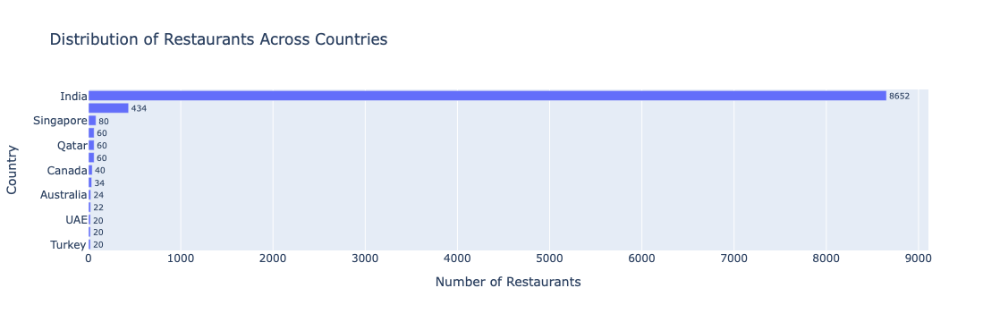

In [30]:
# Count the number of restaurants in each country
country_distribution = data['Country'].value_counts().reset_index()
country_distribution.columns = ['Country', 'Number of Restaurants']

# Create an interactive horizontal bar chart using Plotly
fig = px.bar(
    country_distribution,
    x='Number of Restaurants',
    y='Country',
    orientation='h',
    text='Number of Restaurants',  # Display values on hover
    labels={'Number of Restaurants': 'Number of Restaurants', 'Country': 'Country'},
    title="Distribution of Restaurants Across Countries"
)

# Improve appearance
fig.update_traces(textposition='outside')  # Display text values outside bars
fig.update_layout(yaxis={'categoryorder': 'total ascending'})  # Sort bars in ascending order

# Show the interactive plot
fig.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/443982037.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




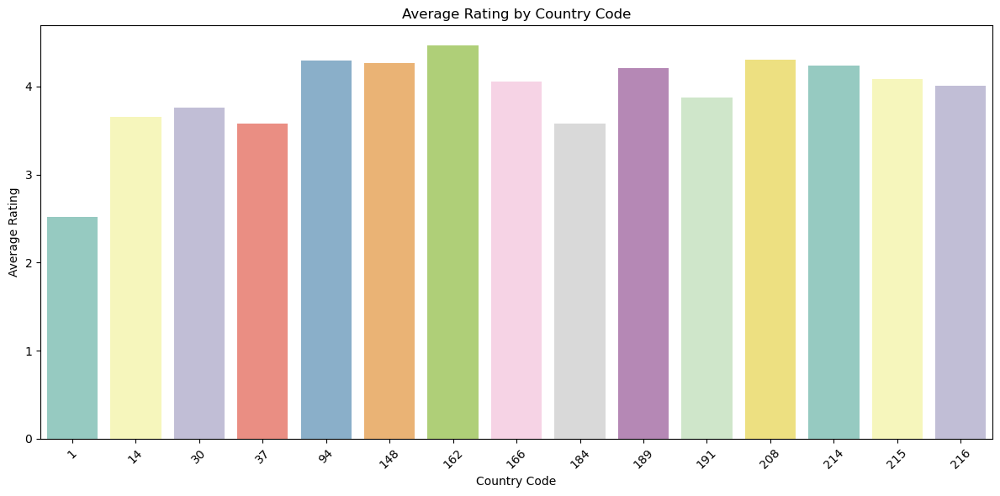

Correlation between Country Code and Average Rating: 0.64


In [31]:
# Group by Country Code and compute the average rating
country_avg_ratings = data.groupby('Country Code')['Aggregate rating'].mean().reset_index()

# Rename columns for clarity
country_avg_ratings.columns = ['Country Code', 'Average Rating']

# Visualize the relationship using a bar plot
plt.figure(figsize=(12, 6))
sns.barplot(x='Country Code', y='Average Rating', data=country_avg_ratings, palette='Set3')
plt.title('Average Rating by Country Code')
plt.xlabel('Country Code')
plt.ylabel('Average Rating')
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()

# Correlation analysis
correlation = country_avg_ratings['Country Code'].corr(country_avg_ratings['Average Rating'])

# Print correlation result
print(f"Correlation between Country Code and Average Rating: {correlation:.2f}")

In [32]:
country_avg_ratings

,Country Code,Average Rating
0,1,2.523324
1,14,3.658333
2,30,3.763333
3,37,3.575000
4,94,4.295238
5,148,4.262500
6,162,4.468182
7,166,4.060000
8,184,3.575000
9,189,4.210000


Pearson Correlation (Latitude vs. Rating): -0.1799
Pearson Correlation (Longitude vs. Rating): -0.2915
Spearman Correlation (Latitude vs. Rating): -0.1224
Spearman Correlation (Longitude vs. Rating): -0.2134
ANOVA Test p-value: 0.0000


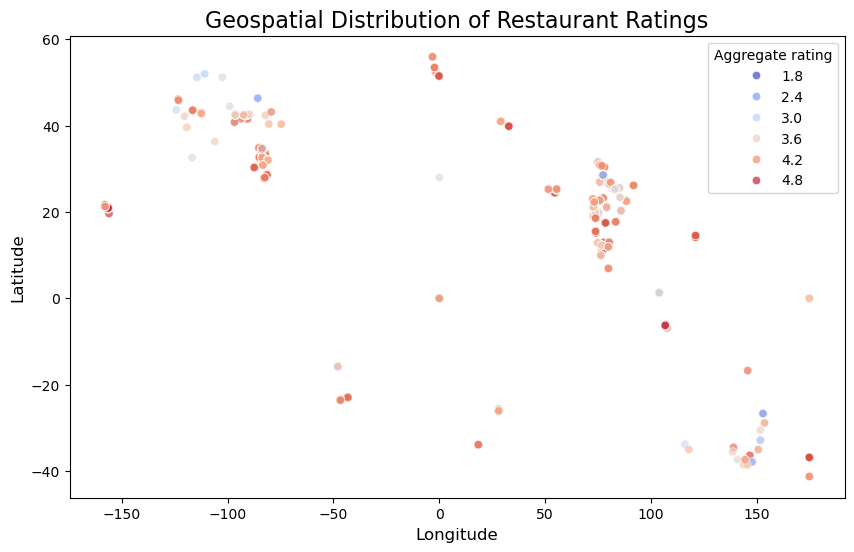

In [33]:
# Ensure the required columns exist
required_columns = ['Latitude', 'Longitude', 'City', 'Aggregate rating']
missing_columns = [col for col in required_columns if col not in data.columns]

if missing_columns:
    raise ValueError(f"Missing columns in dataset: {missing_columns}")

# Remove Not Rated (Aggregate rating = 0)
df_filtered = data[data['Aggregate rating'] > 0]

# Compute Pearson and Spearman correlation between Latitude/Longitude and Ratings
pearson_corr_lat, _ = pearsonr(df_filtered['Latitude'], df_filtered['Aggregate rating'])
pearson_corr_lon, _ = pearsonr(df_filtered['Longitude'], df_filtered['Aggregate rating'])
spearman_corr_lat, _ = spearmanr(df_filtered['Latitude'], df_filtered['Aggregate rating'])
spearman_corr_lon, _ = spearmanr(df_filtered['Longitude'], df_filtered['Aggregate rating'])

print(f"Pearson Correlation (Latitude vs. Rating): {pearson_corr_lat:.4f}")
print(f"Pearson Correlation (Longitude vs. Rating): {pearson_corr_lon:.4f}")
print(f"Spearman Correlation (Latitude vs. Rating): {spearman_corr_lat:.4f}")
print(f"Spearman Correlation (Longitude vs. Rating): {spearman_corr_lon:.4f}")

# Group by city and compute average ratings
city_ratings = df_filtered.groupby('City')['Aggregate rating'].mean().reset_index()
city_ratings = city_ratings.sort_values(by='Aggregate rating', ascending=False)

# ANOVA Test to check if ratings differ significantly across cities
anova_result = f_oneway(*(df_filtered[df_filtered['City'] == city]['Aggregate rating'] for city in df_filtered['City'].unique()))
print(f"ANOVA Test p-value: {anova_result.pvalue:.4f}")

# Scatter Plot: Ratings Across Latitude and Longitude
plt.figure(figsize=(10, 6))
sns.scatterplot(x=df_filtered['Longitude'], y=df_filtered['Latitude'], hue=df_filtered['Aggregate rating'], palette="coolwarm", alpha=0.7)
plt.title("Geospatial Distribution of Restaurant Ratings", fontsize=16)
plt.xlabel("Longitude", fontsize=12)
plt.ylabel("Latitude", fontsize=12)
plt.show()


# Table Booking & Online Delivery

In [34]:
total_restaurants = len(data)

# Calculate the percentage of restaurants offering table booking
table_booking_count = data[data['Has Table booking'] == 'Yes'].shape[0]
table_booking_percentage = (table_booking_count / total_restaurants) * 100

# Calculate the percentage of restaurants offering online delivery
online_delivery_count = data[data['Has Online delivery'] == 'Yes'].shape[0]
online_delivery_percentage = (online_delivery_count / total_restaurants) * 100

# Calculate the percentage of restaurants offering both table booking and online delivery
both_services_count = data[(data['Has Table booking'] == 'Yes') & (data['Has Online delivery'] == 'Yes')].shape[0]
both_services_percentage = (both_services_count / total_restaurants) * 100

# Print the results
print(f"Percentage of restaurants offering table booking: {table_booking_percentage:.2f}%")
print(f"Percentage of restaurants offering online delivery: {online_delivery_percentage:.2f}%")
print(f"Percentage of restaurants offering both services: {both_services_percentage:.2f}%")

Percentage of restaurants offering table booking: 12.12%
Percentage of restaurants offering online delivery: 25.66%
Percentage of restaurants offering both services: 4.55%


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/4137884748.py:10: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




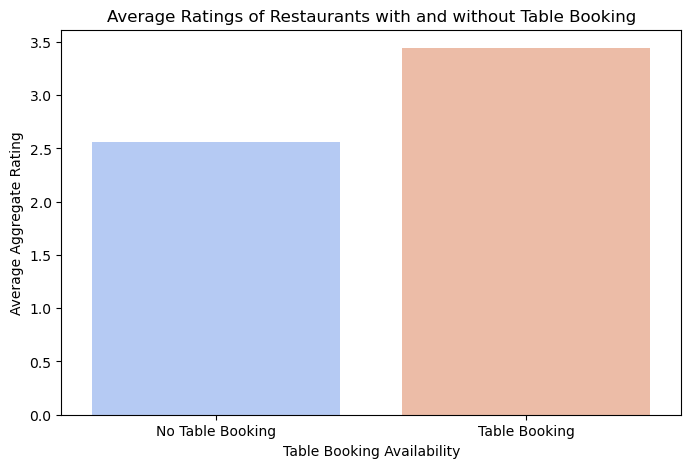

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/4137884748.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




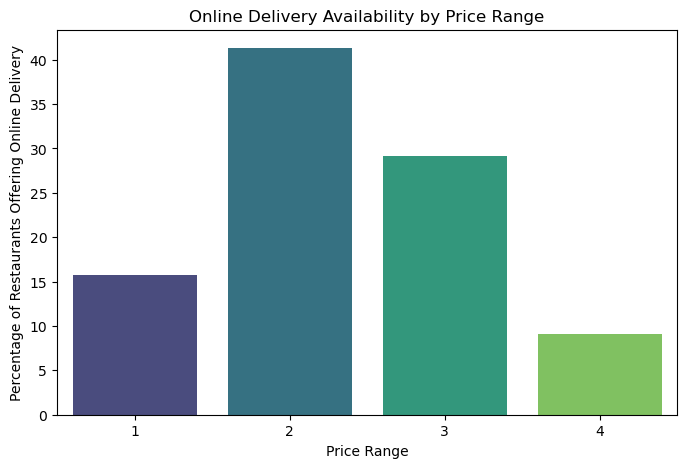

In [35]:
# Convert categorical 'Yes'/'No' to boolean True/False for easier analysis
data['Has Table booking'] = data['Has Table booking'].map({'Yes': True, 'No': False})
data['Has Online delivery'] = data['Has Online delivery'].map({'Yes': True, 'No': False})

### 1️⃣ Compare the Average Ratings of Restaurants with Table Booking and Those Without ###
average_rating_table_booking = data.groupby('Has Table booking')['Aggregate rating'].mean()

# Plot the comparison of average ratings
plt.figure(figsize=(8, 5))
sns.barplot(x=average_rating_table_booking.index.astype(str), y=average_rating_table_booking.values, palette="coolwarm")
plt.xticks([0, 1], ["No Table Booking", "Table Booking"])
plt.xlabel("Table Booking Availability")
plt.ylabel("Average Aggregate Rating")
plt.title("Average Ratings of Restaurants with and without Table Booking")
plt.show()

### 2️⃣ Analyze the Availability of Online Delivery Among Restaurants with Different Price Ranges ###
online_delivery_distribution = data.groupby('Price range')['Has Online delivery'].mean() * 100  # Convert to percentage

# Plot the distribution
plt.figure(figsize=(8, 5))
sns.barplot(x=online_delivery_distribution.index, y=online_delivery_distribution.values, palette="viridis")
plt.xlabel("Price Range")
plt.ylabel("Percentage of Restaurants Offering Online Delivery")
plt.title("Online Delivery Availability by Price Range")
plt.show()

# Price Range Analysis

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/550038766.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




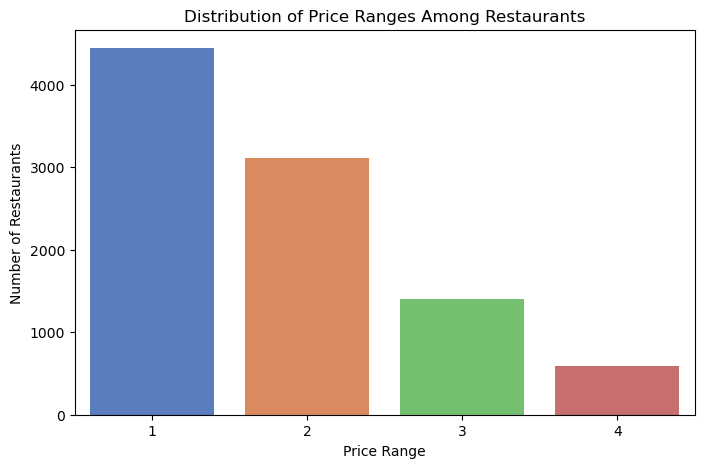

In [36]:
### 1️⃣ Determine the Most Common Price Range ###
most_common_price_range = data['Price range'].value_counts().idxmax()

# Plot the distribution of price ranges
plt.figure(figsize=(8, 5))
sns.countplot(x=data['Price range'], palette="muted")
plt.xlabel("Price Range")
plt.ylabel("Number of Restaurants")
plt.title("Distribution of Price Ranges Among Restaurants")
plt.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/1128685692.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




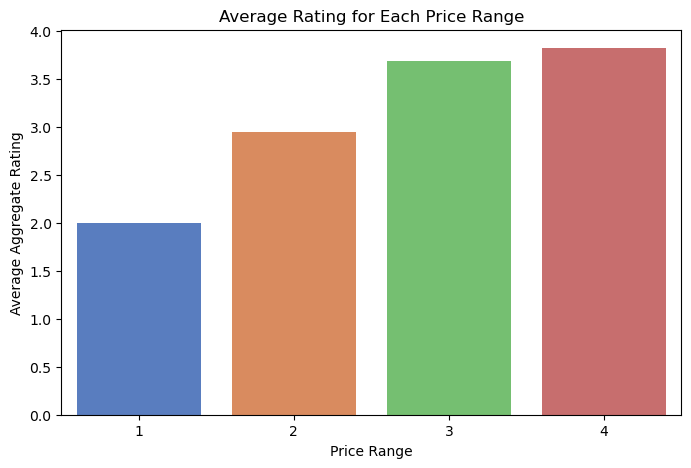

In [38]:
### 2️⃣ Calculate the Average Rating for Each Price Range ###
average_rating_per_price = data.groupby('Price range')['Aggregate rating'].mean()

# Plot the average rating for each price range
plt.figure(figsize=(8, 5))
sns.barplot(x=average_rating_per_price.index, y=average_rating_per_price.values, palette="muted")
plt.xlabel("Price Range")
plt.ylabel("Average Aggregate Rating")
plt.title("Average Rating for Each Price Range")
plt.show()

In [39]:
# Identify the most frequent color for the highest rating in each price range
highest_avg_rating_colors = data.groupby('Price range')['Rating color'].agg(lambda x: x.mode()[0])

# Convert to DataFrame for better readability
highest_avg_rating_colors_df = highest_avg_rating_colors.reset_index()
highest_avg_rating_colors_df.columns = ['Price Range', 'Most Common Rating Color']

# Display the results
print("Highest Rating Colors for Each Price Range:")
print(highest_avg_rating_colors_df)

Highest Rating Colors for Each Price Range:
   Price Range Most Common Rating Color
0            1                   Orange
1            2                   Orange
2            3                   Yellow
3            4                   Yellow


# Feature Engineering

In [40]:
# Replace 'Unknown' with an empty string and count the number of cuisines
data['Number of Cuisines'] = data['Cuisines'].fillna("").replace("Unknown", "").apply(lambda x: len(x.split(',')))

# Ensure that rows where cuisines were 'Unknown' or empty are set to 0
data.loc[data['Cuisines'] == "Unknown", 'Number of Cuisines'] = 0

In [41]:
# Define a dictionary with currency exchange rates to INR (approximate values)
currency_to_inr = {
    "Botswana Pula(P)": 6.10,
    "Brazilian Real(R$)": 17.20,
    "Canadian Dollar(CA$)": 61.50,
    "Indonesian Rupiah(IDR)": 0.0053,
    "NewZealand($)": 52.00,
    "Qatari Rial(QR)": 22.80,
    "Rand(R)": 4.60,
    "Sri Lankan Rupee(LKR)": 0.27,
    "Turkish Lira(TL)": 2.80,
    "UAE Dirham(AED)": 22.50,
    "United States Dollar($)": 83.00,
    "Australian Dollar(A$)": 55.00,
    "British Pound(£)": 105.00,
    "Euro(€)": 90.00,
    "Indian Rupees(INR)": 1.00,  # No conversion needed for INR
    "Philippine Peso(P)": 1.48,
    "Singapore Dollar(S$)": 61.00
}

# Create a new column "Cost in INR" by converting all prices to INR
data['Cost in INR'] = data.apply(
    lambda row: row['Average Cost for two'] * currency_to_inr.get(row['Currency'], 1), axis=1
)


In [42]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   Restaurant ID         9551 non-null   object 
 1   Restaurant Name       9551 non-null   object 
 2   Country Code          9551 non-null   int64  
 3   City                  9551 non-null   object 
 4   Address               9551 non-null   object 
 5   Locality              9551 non-null   object 
 6   Locality Verbose      9551 non-null   object 
 7   Longitude             9551 non-null   float64
 8   Latitude              9551 non-null   float64
 9   Cuisines              9551 non-null   object 
 10  Average Cost for two  9551 non-null   int64  
 11  Currency              9551 non-null   object 
 12  Has Table booking     9551 non-null   bool   
 13  Has Online delivery   9551 non-null   bool   
 14  Is delivering now     9551 non-null   object 
 15  Switch to order menu 

In [43]:
# Convert categorical values to boolean and then to integers
data['Has Table Booking (Binary)'] = (data['Has Table booking'] == 'Yes').astype(int)
data['Has Online Delivery (Binary)'] = (data['Has Online delivery'] == 'Yes').astype(int)

       Aggregate rating  Price range  Value for Money
count       7403.000000  7403.000000      7403.000000
mean           3.440024     1.970147         2.127963
std            0.552195     0.930611         0.937119
min            1.800000     1.000000         0.500000
25%            3.000000     1.000000         1.350000
50%            3.400000     2.000000         1.800000
75%            3.800000     3.000000         3.000000
max            4.900000     4.000000         4.900000


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/71234876.py:5: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/71234876.py:8: FutureWarning:

A value is trying to be set on a copy of a DataFrame or Series through chained assignment using an inplace method.
The behavior will change in pandas 3.0. This inplace method will never work because the intermediate object on which we are setting values always behaves as a copy.

For example, when doing 'df[col].method(value, inplace=True)', try using 'df.method({col: value}, inplace=True)' or df[col] = df[col].method(value) instead, to perform the operation inplace on the original object.



/var/folders/d8/qbh4kpvx1070jvh0n_2l

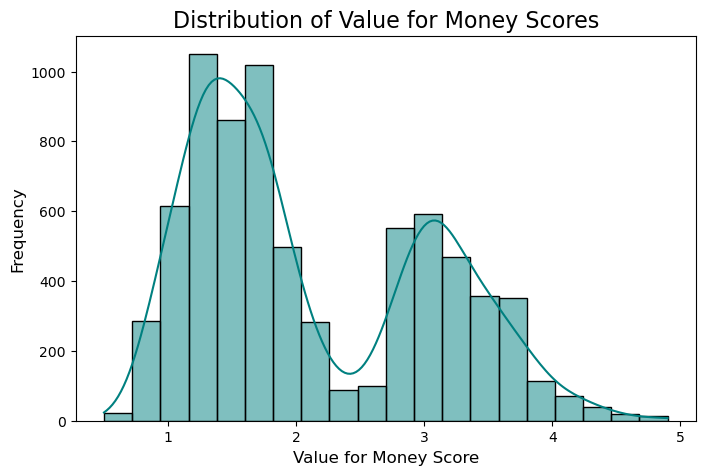

In [44]:
# Filter out restaurants with a 0 rating (not rated)
df_filtered = data[data['Aggregate rating'] > 0]  # Exclude 0 ratings

# Calculate "Value for Money" using the formula (Rating / Price Range)
df_filtered['Value for Money'] = df_filtered['Aggregate rating'] / df_filtered['Price range']

# Handle any infinite or NaN values (if price range is 0, though it's unlikely)
df_filtered['Value for Money'].fillna(0, inplace=True)
df_filtered.replace([float('inf'), -float('inf')], 0, inplace=True)

# Display basic statistics of the new feature
print(df_filtered[['Aggregate rating', 'Price range', 'Value for Money']].describe())

# Plot the distribution of Value for Money scores
plt.figure(figsize=(8, 5))
sns.histplot(df_filtered['Value for Money'], bins=20, kde=True, color='teal')

# Customize the plot
plt.title('Distribution of Value for Money Scores', fontsize=16)
plt.xlabel('Value for Money Score', fontsize=12)
plt.ylabel('Frequency', fontsize=12)

# Show the plot
plt.show()

In [45]:
# Compute "Value for Money" (Rating / Price Range) only for rated restaurants
data['Value for Money'] = data['Aggregate rating'] / data['Price range']

# Set VFM as NaN for "Not Rated" restaurants (Aggregate rating = 0)
data.loc[data['Aggregate rating'] == 0, 'Value for Money'] = np.nan

# Handle any infinite values (if price range is 0, though unlikely)
data.replace([float('inf'), -float('inf')], np.nan, inplace=True)

# Predictive Modeling

In [46]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9551 entries, 0 to 9550
Data columns (total 27 columns):
 #   Column                        Non-Null Count  Dtype  
---  ------                        --------------  -----  
 0   Restaurant ID                 9551 non-null   object 
 1   Restaurant Name               9551 non-null   object 
 2   Country Code                  9551 non-null   int64  
 3   City                          9551 non-null   object 
 4   Address                       9551 non-null   object 
 5   Locality                      9551 non-null   object 
 6   Locality Verbose              9551 non-null   object 
 7   Longitude                     9551 non-null   float64
 8   Latitude                      9551 non-null   float64
 9   Cuisines                      9551 non-null   object 
 10  Average Cost for two          9551 non-null   int64  
 11  Currency                      9551 non-null   object 
 12  Has Table booking             9551 non-null   bool   
 13  Has

In [47]:
required_columns = ['Number of Cuisines', 'Cost in INR', 'Has Table Booking (Binary)',
                    'Has Online Delivery (Binary)', 'Value for Money', 'Aggregate rating']

In [48]:
final_data = data[data['Aggregate rating'] > 0]

In [49]:
# Define input (X) and output (y) variables
X = final_data[['Number of Cuisines', 'Cost in INR', 'Has Table Booking (Binary)', 'Has Online Delivery (Binary)', 'Value for Money']]
y = final_data['Aggregate rating']

# Split the dataset into training and testing sets (80% train, 20% test)
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [50]:
# Initialize and train the Linear Regression model
model = LinearRegression()
model.fit(X_train, y_train)

# Make predictions on the test set
y_pred = model.predict(X_test)

# Evaluate the model
mse = mean_squared_error(y_test, y_pred)
r2 = r2_score(y_test, y_pred)

# Print model evaluation metrics
print(f"Mean Squared Error (MSE): {mse:.4f}")
print(f"R-squared (R²): {r2:.4f}")

Mean Squared Error (MSE): 0.3009
R-squared (R²): 0.0271


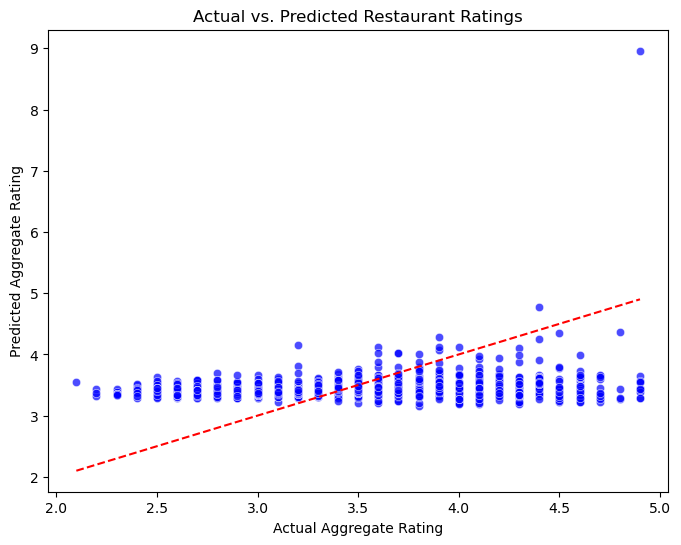

In [51]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=y_test, y=y_pred, alpha=0.7, color='blue')
plt.xlabel("Actual Aggregate Rating")
plt.ylabel("Predicted Aggregate Rating")
plt.title("Actual vs. Predicted Restaurant Ratings")
plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], linestyle='--', color='red')  # 45-degree reference line
plt.show()

In [52]:
dt_model = DecisionTreeRegressor(random_state=42)
dt_model.fit(X_train, y_train)

# Predict on test set
y_pred_dt = dt_model.predict(X_test)

# Evaluate Decision Tree model
mse_dt = mean_squared_error(y_test, y_pred_dt)
r2_dt = r2_score(y_test, y_pred_dt)

print(f"Decision Tree Mean Squared Error (MSE): {mse_dt:.4f}")
print(f"Decision Tree R-squared (R²): {r2_dt:.4f}")

# Initialize and train the Random Forest Regressor
rf_model = RandomForestRegressor(n_estimators=100, random_state=42)
rf_model.fit(X_train, y_train)

# Predict on test set
y_pred_rf = rf_model.predict(X_test)

# Evaluate Random Forest model
mse_rf = mean_squared_error(y_test, y_pred_rf)
r2_rf = r2_score(y_test, y_pred_rf)

print(f"Random Forest Mean Squared Error (MSE): {mse_rf:.4f}")
print(f"Random Forest R-squared (R²): {r2_rf:.4f}")

Decision Tree Mean Squared Error (MSE): 0.0670
Decision Tree R-squared (R²): 0.7834
Random Forest Mean Squared Error (MSE): 0.0440
Random Forest R-squared (R²): 0.8577


# Customer Preference Analysis

In [53]:
# Define country mapping based on known country codes
country_mapping = {
    1: "India", 14: "Australia", 30: "Brazil", 148: "Canada", 162: "Indonesia",
    189: "New Zealand", 208: "Philippines", 214: "Qatar", 215: "Singapore", 
    216: "South Africa", 166: "Sri Lanka", 184: "Turkey", 191: "UAE", 
    234: "United Kingdom", 237: "United States"
}

# Create a new 'Country' column based on 'Country Code'
data['Country'] = data['Country Code'].map(country_mapping)

# Get the unique country names
unique_countries = data['Country'].dropna().unique()

data.to_csv("C:\\Users\\viswa\\Downloads\\Dataset.csv", index=False)

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/1654612462.py:22: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




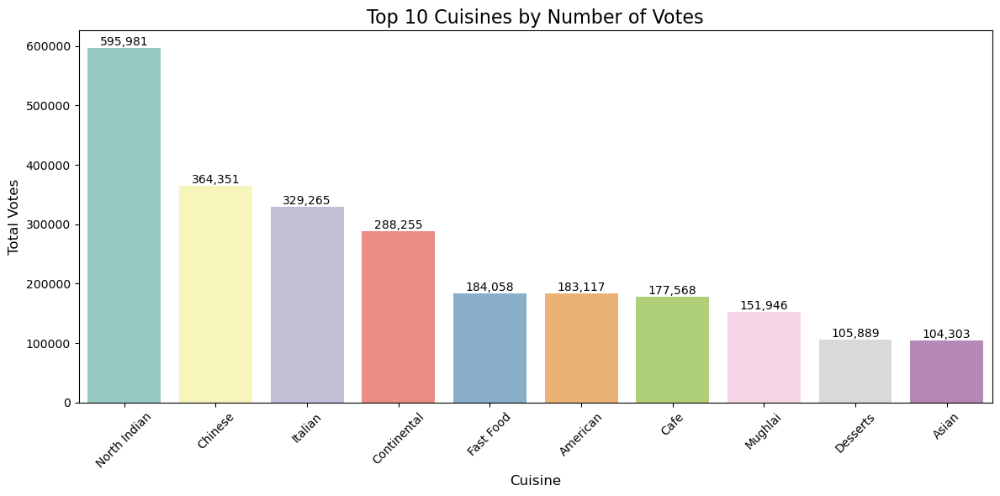

In [55]:
# Create a dictionary to store total votes for each cuisine
cuisine_votes = defaultdict(int)

# Iterate through each row to count votes correctly
for index, row in data.iterrows():
    cuisines = str(row['Cuisines']).split(', ')  # Ensure cuisines are properly split
    votes = row['Votes'] if not pd.isna(row['Votes']) else 0  # Handle missing votes
    for cuisine in cuisines:
        cuisine_votes[cuisine] += votes  # Add votes to the respective cuisine

# Convert to DataFrame for visualization
cuisine_votes_df = pd.DataFrame(cuisine_votes.items(), columns=['Cuisine', 'Total Votes'])
cuisine_votes_df = cuisine_votes_df.sort_values(by='Total Votes', ascending=False)

# Select the top 10 cuisines
top_cuisines = cuisine_votes_df.head(10)

# Create a figure
plt.figure(figsize=(12, 6))

# Create a bar plot
ax = sns.barplot(x=top_cuisines['Cuisine'], y=top_cuisines['Total Votes'], palette='Set3')

# Add labels on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height):,}',  # Format as integer with commas
                (p.get_x() + p.get_width() / 2, height), 
                ha='center', va='bottom', fontsize=10)

# Customize the plot
plt.title('Top 10 Cuisines by Number of Votes', fontsize=16)
plt.xlabel('Cuisine', fontsize=12)
plt.ylabel('Total Votes', fontsize=12)
plt.xticks(rotation=45, fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/3815801513.py:25: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




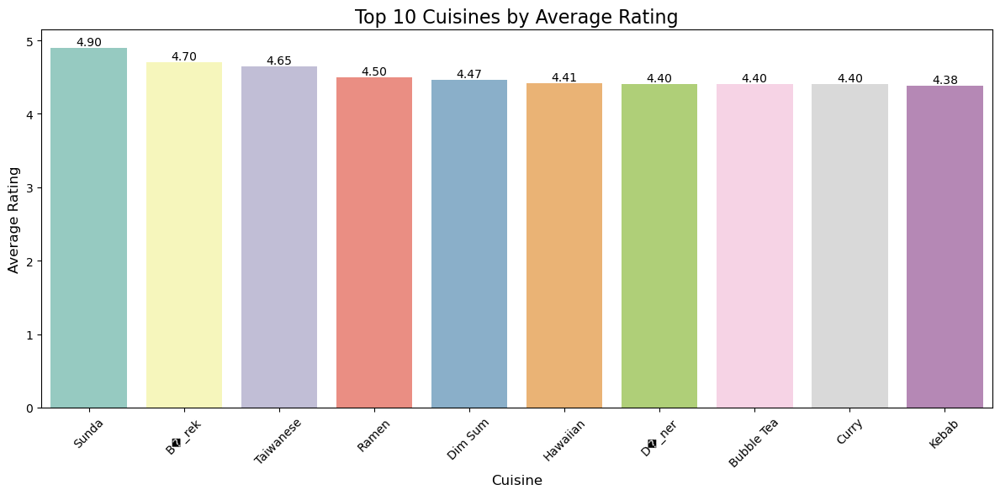

In [56]:
# Create a dictionary to store total ratings and count of occurrences for each cuisine
cuisine_ratings = defaultdict(lambda: {'Total Rating': 0, 'Count': 0})

# Iterate through each row to correctly associate ratings with cuisines
for index, row in data.iterrows():
    cuisines = str(row['Cuisines']).split(', ')  # Ensure cuisines are properly split
    rating = row['Aggregate rating'] if not pd.isna(row['Aggregate rating']) else 0  # Handle missing ratings
    
    for cuisine in cuisines:
        cuisine_ratings[cuisine]['Total Rating'] += rating  # Sum up ratings
        cuisine_ratings[cuisine]['Count'] += 1  # Count occurrences

# Compute the average rating for each cuisine
cuisine_avg_ratings = {cuisine: data['Total Rating'] / data['Count'] for cuisine, data in cuisine_ratings.items() if data['Count'] > 0}

# Convert to DataFrame for visualization
cuisine_avg_ratings_df = pd.DataFrame(cuisine_avg_ratings.items(), columns=['Cuisine', 'Average Rating'])
cuisine_avg_ratings_df = cuisine_avg_ratings_df.sort_values(by='Average Rating', ascending=False)

# Select the top 10 cuisines with the highest ratings
top_cuisines_by_rating = cuisine_avg_ratings_df.head(10)

# Create a bar plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=top_cuisines_by_rating['Cuisine'], y=top_cuisines_by_rating['Average Rating'], palette='Set3')

# Add labels on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{height:.2f}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)

# Customize the plot
plt.title('Top 10 Cuisines by Average Rating', fontsize=16)
plt.xlabel('Cuisine', fontsize=12)
plt.ylabel('Average Rating', fontsize=12)
plt.xticks(rotation=45, fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()


/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/3829849816.py:28: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/3829849816.py:30: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




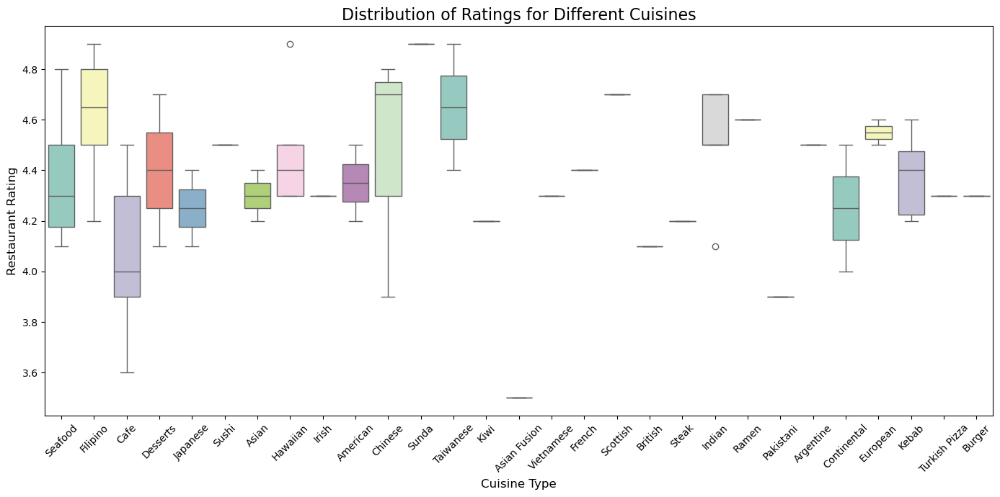

In [57]:

# Create a dictionary to store total ratings and count of occurrences for each cuisine
cuisine_ratings = defaultdict(lambda: {'Total Rating': 0, 'Count': 0})

# Iterate through each row to correctly associate ratings with cuisines
for index, row in data.iterrows():
    cuisines = str(row['Cuisines']).split(', ')  # Ensure cuisines are properly split
    rating = row['Aggregate rating'] if not pd.isna(row['Aggregate rating']) else 0  # Handle missing ratings
    
    for cuisine in cuisines:
        cuisine_ratings[cuisine]['Total Rating'] += rating  # Sum up ratings
        cuisine_ratings[cuisine]['Count'] += 1  # Count occurrences

# Compute the average rating for each cuisine
cuisine_avg_ratings = {cuisine: data['Total Rating'] / data['Count'] 
                       for cuisine, data in cuisine_ratings.items() if data['Count'] > 0}

# Convert to DataFrame for visualization
cuisine_avg_ratings_df = pd.DataFrame(cuisine_avg_ratings.items(), columns=['Cuisine', 'Average Rating'])
cuisine_avg_ratings_df = cuisine_avg_ratings_df.sort_values(by='Average Rating', ascending=False)

# Select the top 10 cuisines with the highest ratings
top_cuisines_by_rating = cuisine_avg_ratings_df.head(10)

# 🔹 2️⃣ Box Plot: Distribution of Ratings for Different Cuisines
plt.figure(figsize=(14, 7))
top_20_cuisines = cuisine_avg_ratings_df['Cuisine'].head(20).tolist()  # Select top 20 cuisines
df_filtered = data[data['Cuisines'].apply(lambda x: any(cuisine in str(x) for cuisine in top_20_cuisines))]  # Filter dataset
df_filtered['Primary Cuisine'] = df_filtered['Cuisines'].apply(lambda x: str(x).split(', ')[0])  # Use first cuisine as primary

ax = sns.boxplot(x='Primary Cuisine', y='Aggregate rating', data=df_filtered, palette='Set3')
plt.xticks(rotation=45, fontsize=10)
plt.title('Distribution of Ratings for Different Cuisines', fontsize=16)
plt.xlabel('Cuisine Type', fontsize=12)
plt.ylabel('Restaurant Rating', fontsize=12)

# Show the plot
plt.tight_layout()
plt.show()


# Data Visualisation

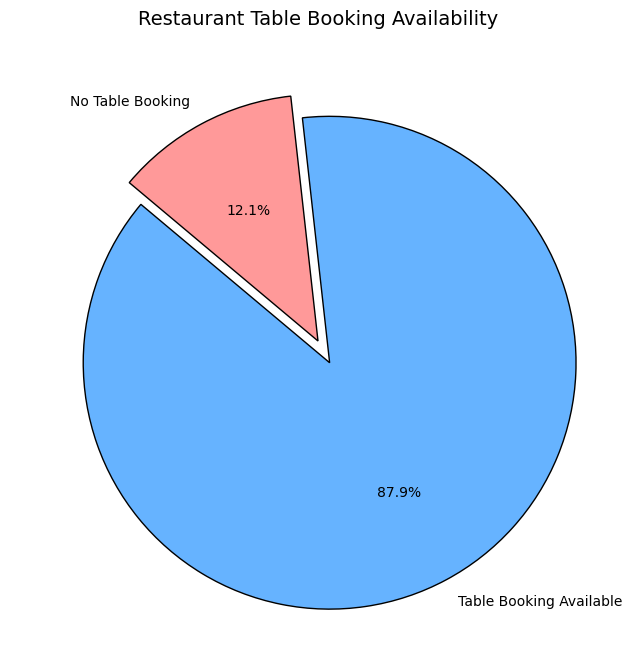

In [58]:
# Count the number of restaurants with and without table booking
table_booking_counts = data['Has Table booking'].value_counts()

# Define colors and labels
colors = ['#66b3ff', '#ff9999']  # Blue for Table Booking, Red for No Table Booking
labels = ['Table Booking Available', 'No Table Booking']

# Create a pie chart with an exploded slice for better emphasis
plt.figure(figsize=(8, 8))
plt.pie(table_booking_counts, labels=labels, autopct='%1.1f%%', colors=colors, 
        startangle=140, wedgeprops={'edgecolor': 'black'}, explode=[0.1, 0])  # Explode the first slice

# Set title
plt.title('Restaurant Table Booking Availability', fontsize=14)

# Show the plot
plt.show()

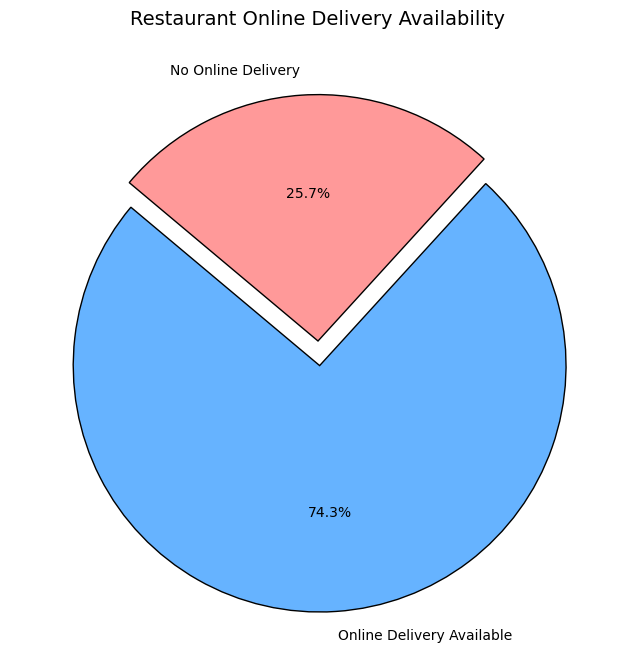

In [59]:
# Count the number of restaurants with and without online delivery
online_delivery_counts = data['Has Online delivery'].value_counts()

# Define labels and colors
labels = ['Online Delivery Available', 'No Online Delivery']
colors = ['#66b3ff', '#ff9999']  # Blue for Available, Red for Not Available

# Create a pie chart with an exploded slice for better emphasis
plt.figure(figsize=(8, 8))
plt.pie(online_delivery_counts, labels=labels, autopct='%1.1f%%', colors=colors, 
        startangle=140, wedgeprops={'edgecolor': 'black'}, explode=[0.1, 0])  # Explode the first slice

# Set title
plt.title('Restaurant Online Delivery Availability', fontsize=14)

# Show the plot
plt.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/3399462526.py:9: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




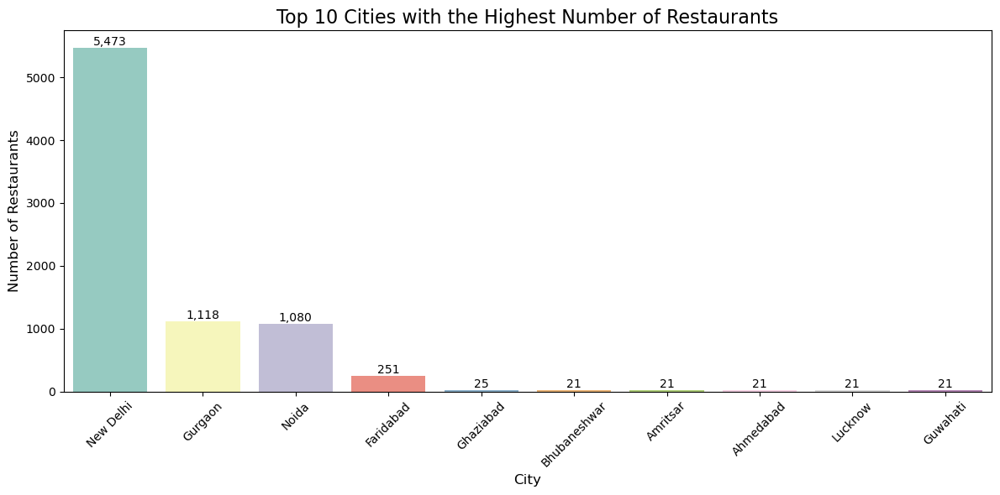

In [60]:
# Count the number of restaurants in each city
city_restaurant_counts = data['City'].value_counts()

# Select the top 10 cities with the highest number of restaurants
top_10_cities = city_restaurant_counts.head(10)

# Create a bar plot
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=top_10_cities.index, y=top_10_cities.values, palette="Set3")

# Add labels on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height):,}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)

# Customize the plot
plt.title('Top 10 Cities with the Highest Number of Restaurants', fontsize=16)
plt.xlabel('City', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.xticks(rotation=45, fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

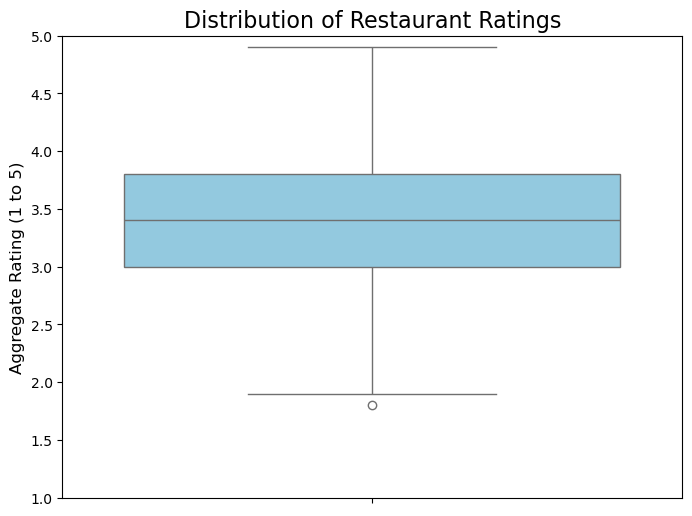

In [61]:
# Filter out restaurants with a 0 rating (not rated)
df_filtered = data[data['Aggregate rating'] > 0]  # Exclude 0 ratings

# Create a box plot for the distribution of valid ratings (1 to 5 scale)
plt.figure(figsize=(8, 6))
ax = sns.boxplot(y=df_filtered['Aggregate rating'], color="skyblue")

# Set the y-axis limits to range from 1 to 5
ax.set_ylim(1, 5)

# Customize the plot
plt.title('Distribution of Restaurant Ratings', fontsize=16)
plt.ylabel('Aggregate Rating (1 to 5)', fontsize=12)

# Show the plot
plt.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/2341180948.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




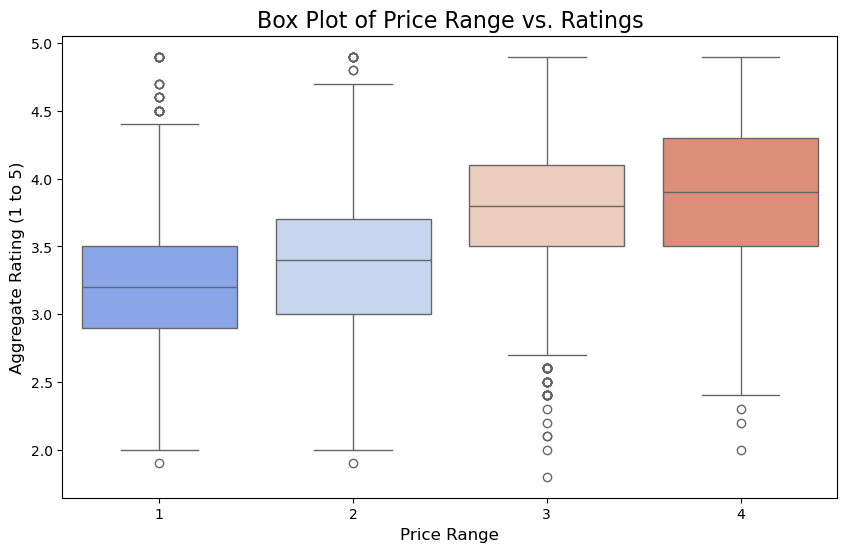

In [62]:
# Filter out restaurants with a 0 rating (not rated)
df_filtered = data[data['Aggregate rating'] > 0]  # Exclude 0 ratings

# Create a box plot for the relationship between Price Range and Ratings
plt.figure(figsize=(10, 6))
ax = sns.boxplot(x=df_filtered['Price range'], y=df_filtered['Aggregate rating'], palette="coolwarm")

# Customize the plot
plt.title('Box Plot of Price Range vs. Ratings', fontsize=16)
plt.xlabel('Price Range', fontsize=12)
plt.ylabel('Aggregate Rating (1 to 5)', fontsize=12)
plt.xticks(rotation=0, fontsize=10)

# Show the plot
plt.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/1489714330.py:6: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




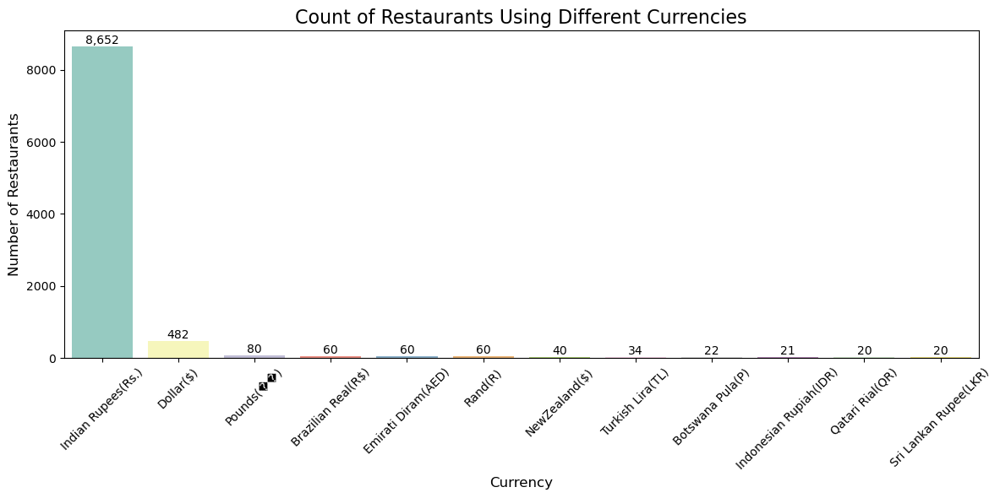

In [63]:
# Count the number of restaurants using each currency
currency_counts = data['Currency'].value_counts()

# Create a bar plot for currency counts
plt.figure(figsize=(12, 6))
ax = sns.barplot(x=currency_counts.index, y=currency_counts.values, palette="Set3")

# Add labels on top of the bars
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height):,}', (p.get_x() + p.get_width() / 2, height), ha='center', va='bottom', fontsize=10)

# Customize the plot
plt.title('Count of Restaurants Using Different Currencies', fontsize=16)
plt.xlabel('Currency', fontsize=12)
plt.ylabel('Number of Restaurants', fontsize=12)
plt.xticks(rotation=45, fontsize=10)

# Show the plot
plt.tight_layout()
plt.show()

/var/folders/d8/qbh4kpvx1070jvh0n_2l3jt40000gn/T/ipykernel_67504/2755393600.py:2: FutureWarning:



Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.




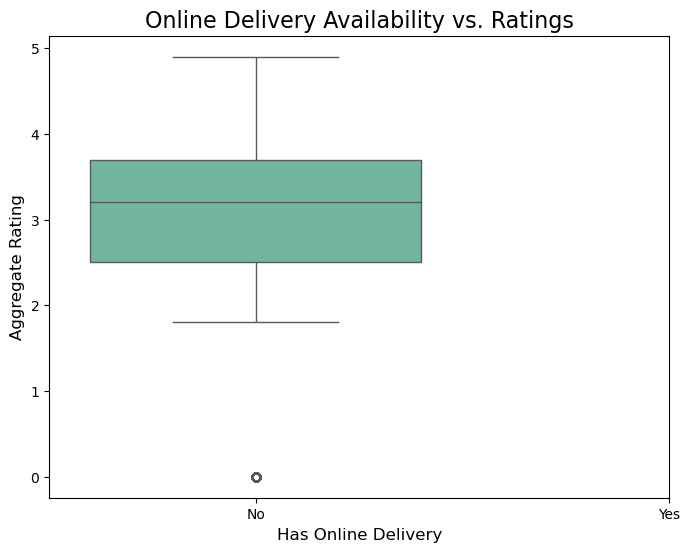

In [64]:
plt.figure(figsize=(8, 6))
sns.boxplot(x=data['Has Online Delivery (Binary)'], y=data['Aggregate rating'], palette="Set2")
plt.title("Online Delivery Availability vs. Ratings", fontsize=16)
plt.xlabel("Has Online Delivery", fontsize=12)
plt.ylabel("Aggregate Rating", fontsize=12)
plt.xticks(ticks=[0, 1], labels=["No", "Yes"])
plt.show()


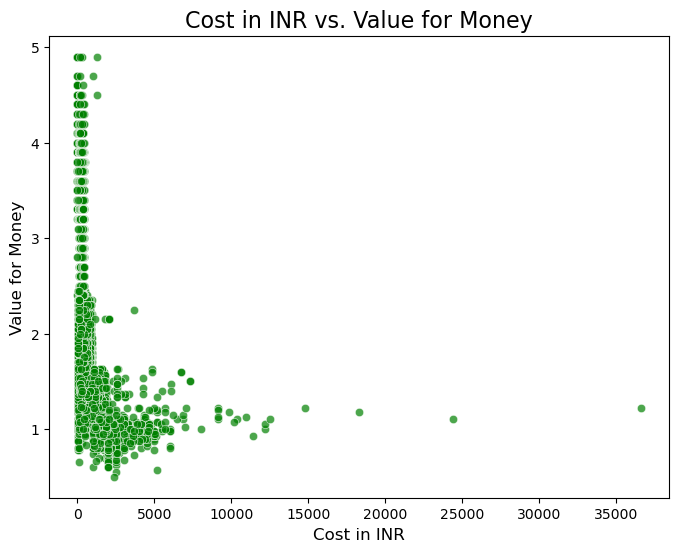

In [65]:
plt.figure(figsize=(8, 6))
sns.scatterplot(x=data['Cost in INR'], y=data['Value for Money'], alpha=0.7, color='green')
plt.title("Cost in INR vs. Value for Money", fontsize=16)
plt.xlabel("Cost in INR", fontsize=12)
plt.ylabel("Value for Money", fontsize=12)
plt.show()

In [66]:
data.to_csv("Final_dataset.csv")